# <a href="https://thetahat.ru/courses/ad" target="_top">Работа с данными</a>

## Exploratory Data Analysis (EDA)


В любой задаче, связанной с анализом данных, первым шагом всегда становится знакомство с самим датасетом. Прежде чем строить модели или делать выводы, важно оценить структуру, полноту и качество информации. Такой осмысленный подход к предварительному изучению данных получил название *Exploratory Data Analysis (EDA)*, он позволяет выявить проблемы, обнаружить закономерности и определить направления для дальнейшей работы.

### Цели EDA

**EDA (Exploratory Data Analysis — разведочный анализ данных)** помогает понять, с какими данными мы имеем дело, насколько они пригодны для анализа и в каком направлении двигаться дальше. В рамках этого анализа мы ставим следующие цели:

---

#### 1. Проверить качество и надёжность данных
- Обнаружить пропущенные, дубликатные или странные значения.
- Найти несоответствия в формате (например, `'male'` и `'Male'` в колонке пола).
- Определить, какие признаки не несут полезной информации или имеют подозрительное распределение.

---

#### 2. Оценить распределение признаков и пригодность данных к анализу
- Проверить, насколько сбалансированы классы или категории.
- Найти колонки с одним уникальным значением или нерепрезентативным содержанием.
- Убедиться, что данные позволяют ответить на поставленные вопросы.
  - *Пример*: если нужно сравнить интеллект котов и собак, а котов всего 3, — такой анализ не имеет смысла.
  - *Пример*: если нужно проверить, реже ли имеют детей образованные люди, а в выборке перекос по возрасту и доходу — нужно учитывать это в дальнейшем анализе или запросить другие данные.

  Пример из жизни: сейчас в Великобритании женщины 18-24 лет зарабатывают больше мужчин того же возраста на 10%. Если бы нам дали датасет, в котором мужчины и женщины имеют разное возрастное распределение, то анализ был бы не совсем честным.

---

#### 3. Сформулировать гипотезы, связанные с целевой переменной
- Предположить, какие признаки могут влиять на целевую переменную.
- Подготовиться к следующему этапу — построению модели или проверке статистических зависимостей.
- *Пример гипотезы*: «Образованные люди реже имеют детей», «Стаж влияет на уровень зарплаты», и т.п.


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
import scipy.stats as sps
%matplotlib inline

sns.set(palette="pastel", style='whitegrid', font_scale=1.3)

import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)


### Данные retail




Аналитиков часто нанимают в **retail**, потому что маркетплейсы генерируют тонны данных — о товарах, действиях пользователей, продажах. Это отличная среда для аналитики, где много возможностей для экспериментов, тестов и оптимизаций.

Для бизнеса аналитик — это не просто “человек с графиками”. Это специалист, который помогает **принимать решения**, опираясь на данные. Его задача — находить закономерности, проверять гипотезы и обеспечивать доказательную базу для бизнес-решений.

---

**Описание датасета**

Мы будем работать с [датасетом маркетинговой кампании](https://www.kaggle.com/datasets/ahsan81/superstore-marketing-campaign-dataset).

Ниже — описание признаков, данные собраны за последние два года до прошлогодней кампании, `Response` — отклик клиента на прошлую коммуникацию:

| Название столбца         | Описание                                                                 |
|---------------------------|--------------------------------------------------------------------------|
| **Response**              | Целевая переменная: `1`, если клиент принял предложение, иначе `0`       |
| **ID**                    | Уникальный идентификатор клиента                                        |
| **Year_Birth**            | Год рождения клиента                                                    |
| **Complain**              | `1`, если клиент жаловался за последние 2 года                           |
| **Dt_Customer**           | Дата регистрации клиента в компании                                     |
| **Education**             | Уровень образования клиента                                             |
| **Marital**               | Семейное положение клиента                                              |
| **Kidhome**               | Количество маленьких детей в семье                                      |
| **Teenhome**              | Количество подростков в семье                                           |
| **Income**                | Годовой доход домохозяйства клиента                                     |
| **MntFishProducts**       | Потрачено на рыбу за последние 2 года                                   |
| **MntMeatProducts**       | Потрачено на мясо                                                       |
| **MntFruits**             | Потрачено на фрукты                                                     |
| **MntSweetProducts**      | Потрачено на сладости                                                   |
| **MntWines**              | Потрачено на вино                                                       |
| **MntGoldProds**          | Потрачено на золотые товары                                             |
| **NumDealsPurchases**     | Количество покупок по скидкам                                           |
| **NumCatalogPurchases**   | Количество покупок по каталогу (доставка)                               |
| **NumStorePurchases**     | Количество покупок в офлайн-магазинах                                   |
| **NumWebPurchases**       | Количество покупок через сайт                                           |
| **NumWebVisitsMonth**     | Количество визитов на сайт за последний месяц                           |
| **Recency**               | Сколько дней назад была последняя покупка                               |

---

**Вопрос бизнеса**

Магазин хочет понять:

> **Насколько вероятно, что покупатель ответит положительно на рекламное предложение?**

Если удастся найти закономерности, можно **таргетировать кампанию** только на тех, кто с высокой вероятностью откликнется — и тем самым сократить издержки.


---

**Условия кампании**

Рекламная кампания: клиент получает **скидочную карту за 500 у.е.**, которая дает скидку на 20% от стоимости (в другие дни цена такой карты — 900).

> _Здесь можно предложить любую кампанию — главное, чтобы она имела понятную **стоимость** для бизнеса и потенциальную **ценность** для клиента._

---


> **Зачем вообще делать анализ? Почему не разослать предложение всем клиентам?**

Потому что это **дорого**. Каждая карта стоит денег, и если отправить её всем подряд, то:
- многие не откликнутся (а ресурсы будут потрачены);
- кампания может стать убыточной;
- может пострадать восприятие бренда (слишком частые/некорректные рассылки).

Поэтому наша задача — **найти признаки, по которым можно предсказать отклик.**

---

**Гипотезы**

&#x2753; **Вопрос** &#x2753;

>Какие признаки, по вашему мнению, могут влиять на то, откликнется ли клиент?

>- Чем больше клиент тратит, тем выше вероятность, что он купит карту?
- Клиенты с детьми экономнее?
- Пожилые клиенты менее склонны участвовать в акциях?
>- Жалобы в прошлом снижают вероятность отклика? Или наоборот, можно разослать кампанию тем, кто жаловался, и тогда они вернутся к нам снова?
---

Начнем с исследования данных, пока отложим вопрос бизнеса на потом.



### 1. Работа с датасетом

Теперь посмотрим на данные: как они выглядят, что с ними можно сделать, чтобы были более удобные.

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ahsan81/superstore-marketing-campaign-dataset")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/ahsan81/superstore-marketing-campaign-dataset/versions/7


In [8]:
data = pd.read_csv('superstore_data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Id                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

У нас есть несколько пропущенных значений в столбце дохода. Можно сделать следующее:
<details>

  - выкинуть

  - заполнить абсурдными значениями (-1 или 1e10, например)  

  - заполнить медианой, средним или каким-то другим способом  

Это решение будет зависеть от поставленной задачи.
</details>

Так как их совсем немного, можно их просто исключить.

In [ ]:
data = data[data['Income'].notna()].copy()

Проверим, есть ли дубликаты. Такое бывает, могли быть проблемы с

1.   Новый пункт
2.   Новый пункт

join'ами во время сборки датасета.


In [9]:
duplicate_rows = data.duplicated()
print(f"Полных дубликатов: {duplicate_rows.sum()}")

Полных дубликатов: 0


In [10]:
duplicate_rows = data['Id'].duplicated()
print(f"Дубликаты клиентов: {duplicate_rows.sum()}")

Дубликаты клиентов: 0


Видим, что в данных присутствует личная информация о клиентах — возраст, семейное положение, образование, а также поведенческие характеристики: количество и сумма покупок, покупки со скидками, покупки в магазине и на сайте, количество просмотров и т.д. Также есть столбцы `Response` — отклик на прошлую рекламную кампанию, и `Complain` — наличие жалоб клиента за последние два года.

&#x2753; **Вопрос** &#x2753;

> Какие новые признаки можно добавить для улучшения анализа данных?

<details> <summary>Открыть объяснение</summary>

Примеры новых признаков:

* Объединить количество детей и подростков в общий признак `Total_Children`
* Рассчитать `Total_Spent` — общую сумму покупок, просуммировав траты по всем категориям
* Вместо даты рождения добавить возраст клиента (если точный год неизвестен, можно задать его приближённо)

</details><br/>

In [ ]:
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'], format='%m/%d/%Y')
# data['Age'] = 1990 - data['Year_Birth'] пока не будем добавлять, сделаем это позже
data['Total_Children'] = data['Kidhome'] + data['Teenhome']
data['Total_Spent'] = data[['MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']].sum(axis=1)


У нас есть категориальные и числовые признаки.
Категориальные — это признаки, которые принимают ограниченное число значений (например: пол, образование, “да/нет”), и обычно не имеют арифметического смысла — их не стоит складывать, делить или напрямую сравнивать по величине.

Числовые признаки, наоборот, имеют количественную природу — их можно усреднять, сравнивать (больше/меньше), использовать в вычислениях.

Разделим сразу признаки на группы:

In [13]:
cat_columns = ['Education', 'Marital_Status', 'Kidhome', 'Teenhome', 'Total_Children', 'Response', 'Complain']
num_columns = ['Year_Birth', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
               'NumDealsPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
               'NumWebVisitsMonth', 'Total_Spent', 'Income', 'Recency']

Обратим внимание, что число детей мы отнесли к категориальному признаку, хотя в колонке числа 0,1, 2, что, формально, является числами. А год рождения (тоже дискретный) — к числовым.

&#x2753; **Вопрос** &#x2753;

> Почему так?

<details> <summary>Открыть объяснение</summary>

Число детей — это ограниченное и неравномерное множество значений (например, 0, 1, 2), где между соседними числами нет очевидной линейной зависимости.

Эти значения часто используют как категории — например, можно закодировать через one-hot.

Возраст, наоборот, — количественный признак: его можно усреднять, вычитать, сравнивать, он ближе к непрерывной шкале.
</details>



### 2. Работа с категориальными данными

Начнем с двух визуализаций. Возьмем колонку `Education` и визуализируем с помощью `Bar Plot` и `Pie Chart`:

**Bar plot**

Классическая гистограмма для категориальных признаков. Показывает, сколько раз встречается каждое значение. Удобно использовать для первичного анализа распределений. Можно добавить аннотации с процентами, чтобы стало нагляднее.

**Pie Chart**

Круговая диаграмма для визуализации долей каждой категории от общего числа. Полезно, когда нужно показать, какая часть занимает категория в общей структуре, но плохо читается при большом количестве категорий.

При этом, с ними надо быть осторожнее, так как человеческий глаз не может достоверно сравнить размеры сегментов. Это может привести к ложным выводам, поэтому использовать ее не рекомендуется.

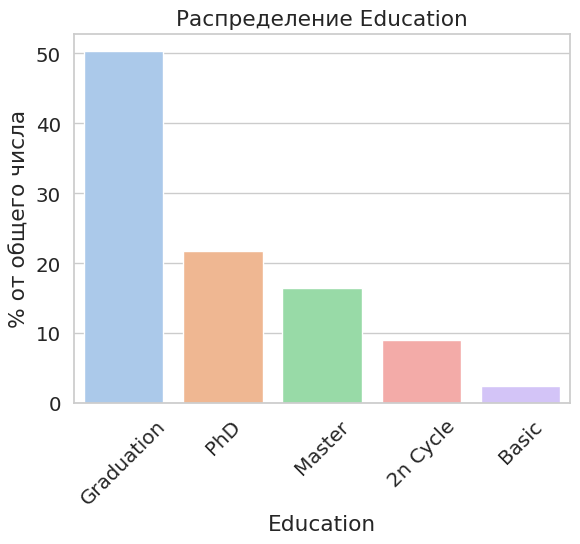

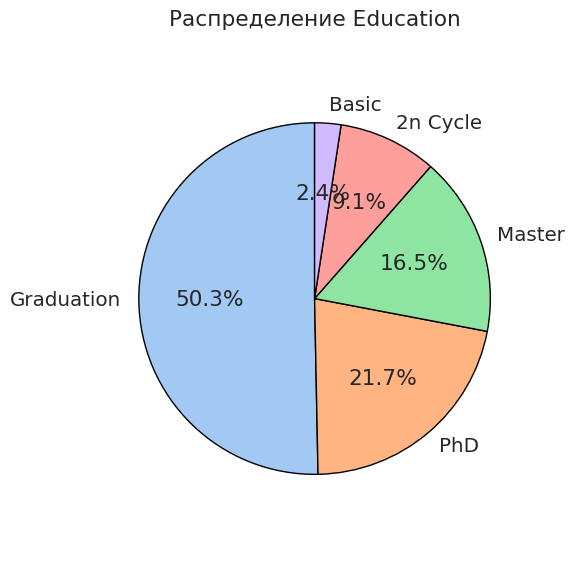

In [11]:
edu_counts = data['Education'].value_counts(normalize=True) * 100
sns.barplot(x=edu_counts.index, y=edu_counts.values, palette='pastel')
plt.ylabel('% от общего числа')
plt.title('Распределение Education')
plt.xticks(rotation=45)
plt.show()

edu_counts = data['Education'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(
    edu_counts,
    labels=edu_counts.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=sns.color_palette('pastel'),
    wedgeprops={'edgecolor': 'black'}
)
plt.title('Распределение Education')
plt.axis('equal')
plt.tight_layout()
plt.show()

Данные можно визуализировать по-разному, сейчас мы рассмотрим некоторые способы.

Посмотреть на категориальные данные с помощью *барплотов*:

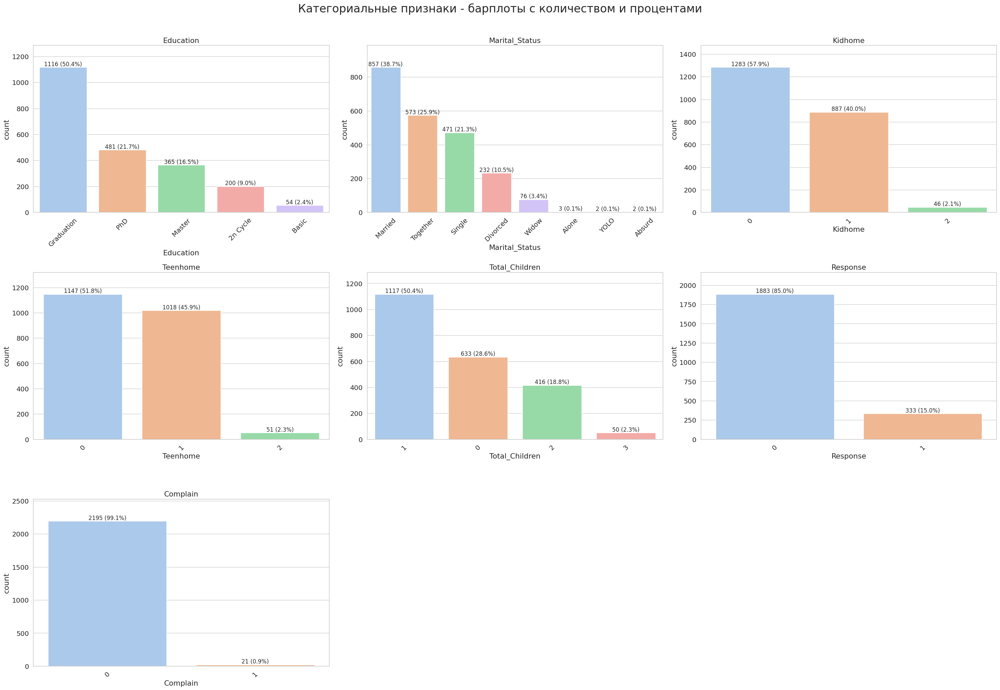

In [ ]:
n_cat = len(cat_columns)
cols = 3
rows = math.ceil(n_cat / cols)

fig_cat, axes_cat = plt.subplots(rows, cols, figsize=(cols * 10, rows * 7))
axes_cat = axes_cat.flatten()

for i, col in enumerate(cat_columns):
    ax = axes_cat[i]
    order = data[col].value_counts().index  # Чтобы порядок был по убыванию
    counts = data[col].value_counts()
    total = len(data)

    sns.countplot(data=data, x=col, ax=ax, order=order, palette="pastel", legend=False)
    ax.set_title(col)
    ax.tick_params(axis='x', rotation=45)

    for p in ax.patches:
        count = int(p.get_height())
        percent = 100 * count / total
        ax.annotate(f'{count} ({percent:.1f}%)',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=12)
    ax.set_ylim(0, max(counts.values) * 1.15)

# Удаляем лишние оси
for j in range(i + 1, len(axes_cat)):
    fig_cat.delaxes(axes_cat[j])

fig_cat.suptitle("Категориальные признаки - барплоты с количеством и процентами", fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

&#x2753; **Вопрос** &#x2753;

> Что можно сказать по этим графикам?

<details>
 <summary> Открыть объяснение </summary>

* Большинство имеют высшее образование, магистров и кандидатов больше трети.

* Больше половины состоят в отношениях

* Половина семей имеет одного ребенка, меньше трети — без детей

* На предыдущую кампанию откликнулось 15%, что неплохой показатель для рекламной кампании, возможно на следующую тоже ответят хорошо

* Менее одного процента жаловались на магазин, значит покупатели в целом всем довольны.
</details><br/>

Что можно изменить в этих данных и на какие мысли они нас могут натолкнуть?

* Категории `Basic` и `2n Cycle` довольно экзотичные — кандидаты на исключение или объединение.
* Категории `Single` и `Alone` — взаимозаменяемые, можно объединить, а `YOLO` и `Absurd` можно исключить, так как нет понимания, что это, а их количество очень маленькое.



In [ ]:
# Объединяем категории
data['Marital_Status'] = data['Marital_Status'].replace({'Alone': 'Single'})

# Удаляем нерелевантные значения
data = data[~data['Marital_Status'].isin(['YOLO', 'Absurd'])].copy()

А что с образованием? После небольшого ресерча в гугле можно прийти к выводу, что `Basic` это старшая или средняя школа, а `2n Cycle` это магистратура. Но пока оставим группы как есть, просто запомним эту информацию.

Мы убрали неугодные данные, их совсем немного, поэтому вполне уместно, продолжаем.

Посмотрим еще способы, как визуализировать категориальные данные:

**Stacked bar plot**

Сложенные столбцы позволяют одновременно анализировать распределение одного признака внутри другого. Например, как семейное положение распределено по уровням образования. Удобно видеть как абсолютные значения, так и структуру внутри каждой группы.

**Crosstab heatmap**

Тепловая карта по кросстаблице двух категориальных признаков. Показывает частоты или доли в виде цветовой интенсивности. Отлично работает, когда нужно быстро найти перекосы или паттерны между двумя признаками.

Можно так же проанализировать признак внутри другого:

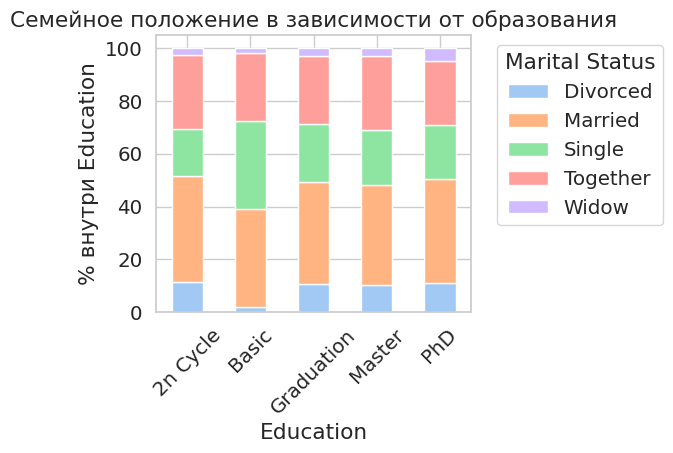

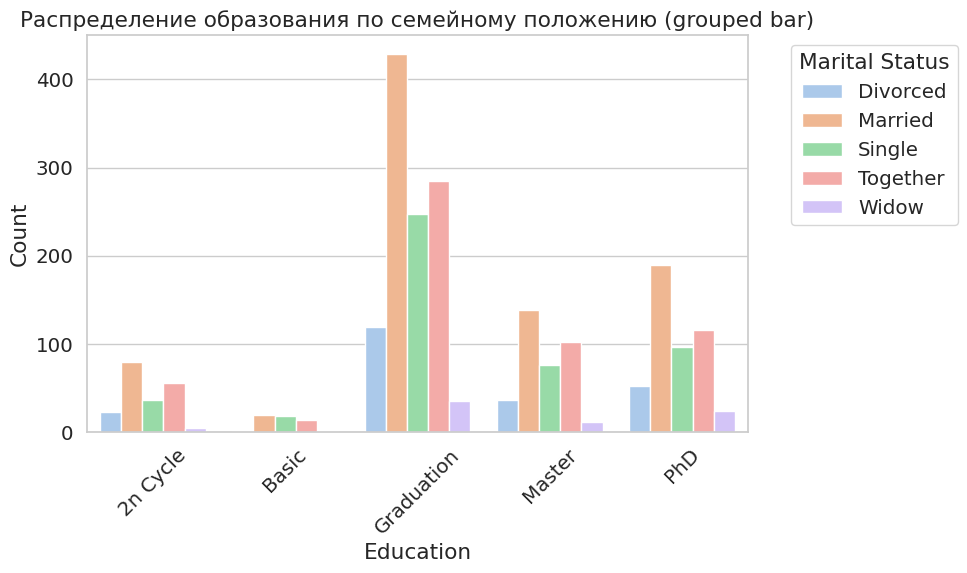

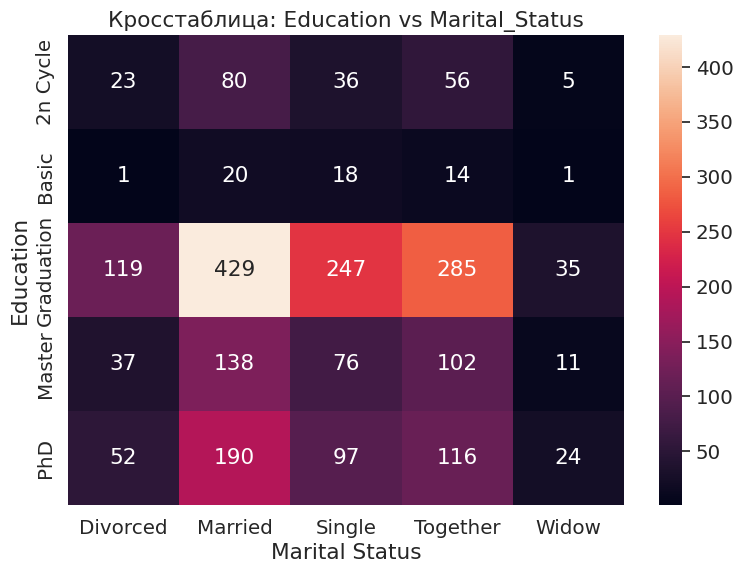

In [ ]:
# Создаем кросс-таблицу с абсолютными значениями
cross_counts = pd.crosstab(data['Education'], data['Marital_Status'])

# Преобразуем таблицу в длинный формат для seaborn
grouped_data = cross_counts.reset_index().melt(id_vars='Education',
                                              var_name='Marital_Status',
                                              value_name='Count')


# Stacked Bar
cross_tab = pd.crosstab(data['Education'], data['Marital_Status'], normalize='index') * 100
cross_tab.plot(kind='bar', stacked=True)
plt.ylabel('% внутри Education')
plt.title('Семейное положение в зависимости от образования')
plt.legend(title='Marital Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Grouped Barplot
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_data, x='Education', y='Count', hue='Marital_Status')
plt.title('Распределение образования по семейному положению (grouped bar)')
plt.xticks(rotation=45)
plt.legend(title='Marital Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cross_counts, annot=True, fmt='d')
plt.title('Кросстаблица: Education vs Marital_Status')
plt.ylabel('Education')
plt.xlabel('Marital Status')
plt.tight_layout()
plt.show()


&#x2753; **Вопрос** &#x2753;

> Что можно сказать по этим данным?

> Какой вариант вам больше нравится?

### 3. Работа с числовыми данными

Возьмем признак `Income` и визуализируем несколькими способами.

**Методы визуализации распределения**

---

**Гистограмма** (`histplot`)

Гистограмма показывает, **как часто встречаются значения** в разных диапазонах.  
Полезна для понимания формы распределения, особенно при больших объёмах данных. Гистограммы — простой и наглядный способ, в котором хорошо будет видно моду (самое частое значение) и примерное распределение полученных данных

Но она довольно чувствительна к количеству бинов (`bins`) и не показывают гладкое распределение.

**Параметры `sns.histplot()`:**
- `data` — выборка данных
- `bins` — количество интервалов
- `kde` — добавить ли KDE-график (`True/False`)
- `stat` — `'count'`, `'density'`, `'probability'`
- `color`, `edgecolor`, `alpha` — внешний вид

---

**Box Plot (ящик с усами)**

Показывает медиану, квартили 1 и 3 (границы ящика), выбросы (значения за пределами 1.5×IQR)


Полезен для **поиска аномалий и асимметрии** в данных. Показывает разброс данных и выбросы.

Но не показывает форму распределения и может быть неинформативным при малом объеме данных.


**Параметры `sns.boxplot()`:**
- `x` или `y` — переменная для оси
- `hue` — группировка по категориям
- `color`, `width` — стилизация
- `orient` — `'v'` или `'h'` (вертикально/горизонтально)

---

**Violin Plot (виолончель)**

Комбинирует:
- **KDE (гладкая плотность)**
- **Boxplot (медиана, IQR)**
- Показывает распределение и форму в одном графике


**Параметры `sns.violinplot()`:**
- `inner='box'` — отображает встроенный boxplot
- `cut=0` — обрезает хвосты, скрывая выбросы
- `bw` — ширина окна сглаживания
- `hue`, `split`, `scale` — группировка и масштаб

---



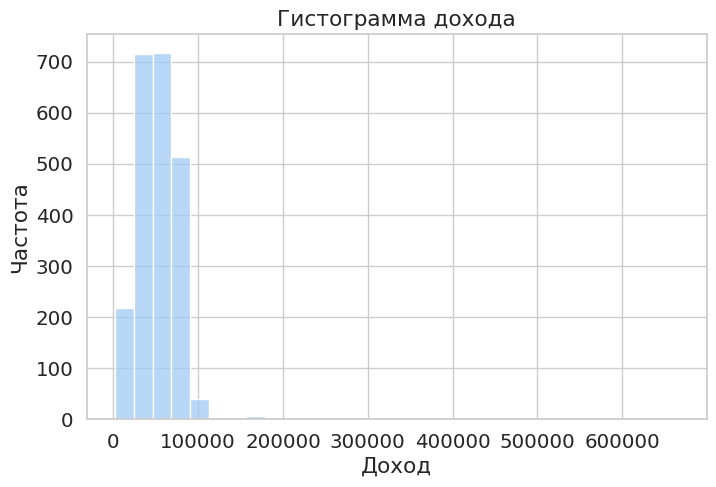

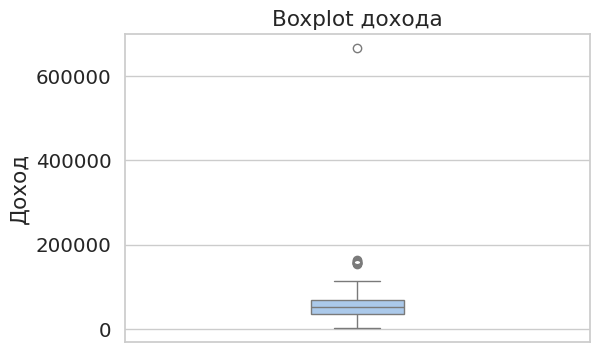

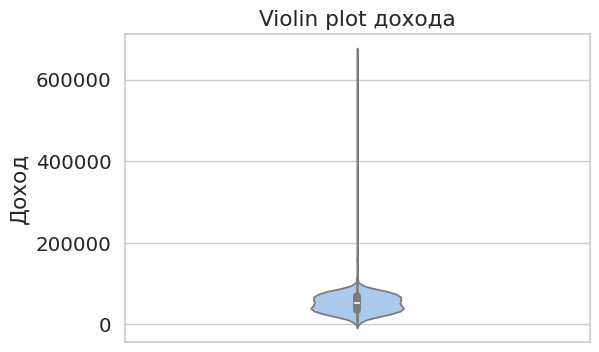

In [ ]:
# Гистограмма
plt.figure(figsize=(8, 5))
sns.histplot(data['Income'], bins=30)
plt.title('Гистограмма дохода')
plt.xlabel('Доход')
plt.ylabel('Частота')
plt.show()

# Боксплот
plt.figure(figsize=(6, 4))
sns.boxplot(y=data['Income'], width=0.2)
plt.title('Boxplot дохода')
plt.ylabel('Доход')
plt.show()

# Violin plot
plt.figure(figsize=(6, 4))
sns.violinplot(y=data['Income'], inner='box', width=0.2)
plt.title('Violin plot дохода')
plt.ylabel('Доход')
plt.show()


> **Ядерная оценка плотности**
>
>Плавная оценка распределения, без резких столбиков.  
Хорошо показывает форму, пики и хвосты, но может быть неустойчива к выбросам.
>
> **Смысл:** в каждую точку выборки поставили отмасштабированное ядро так, будто эта точка — центр ядра, а затем усреднили значения соседних точек с весами, заданными этим ядром. Вместо тысячи слов — [интерактивная иллюстрация](https://mathisonian.github.io/kde/).
>
>Ядерные оценки плотности — KDE, Kernel Density Estimates — способ что-то понять о распределении, когда неизвестно ничего. Такого рода методы называют **непараметрическими**, они иллюстрируют разницу подходов в статистике и теории вероятностей: если в теории вероятности известно распределение и исследуются его свойства, то в статистике зачастую известны только данные, и по их свойствам угадывается распределение.
>
>
<details>
<summary>Технические детали</summary>

Можно воспользоваться функциями:

- `sns.histplot()` — гистограмма и KDE
- `sns.kdeplot()` — только KDE
- `sns.rugplot()` — отдельный rug (штрихи)
- `scipy.stats` — для наложения теоретической плотности

---

`sns.histplot()`

* `data` — данные, которые визуализируются (например, `data['Income']`)
* `bins` — количество интервалов (по умолчанию выбирается автоматически)
* `kde` — добавить ли ядерную оценку плотности (`True/False`)
* `stat` — тип значения на оси Y: `'count'`, `'frequency'`, `'density'`, `'probability'`
* `color` — цвет столбиков
* `edgecolor` — цвет границ столбиков
* `alpha` — прозрачность (от `0.0` до `1.0`)
* `multiple` — наложение или группировка (`'stack'`, `'dodge'`, `'fill'`)

---

`sns.kdeplot()`

* `data` — данные для оценки плотности
* `fill` — закрашивать ли под кривой (`True/False`)
* `bw_adjust` — ширина окна сглаживания (больше → более гладкая кривая)
* `color` — цвет линии
* `label` — подпись в легенде
* `linewidth` — толщина линии

---

`sns.rugplot()`

* `data` — данные, где рисовать "штрихи"
* `height` — высота штрихов
* `color` — цвет
* `alpha` — прозрачность

---

`scipy.stats.norm.fit()` и `norm.pdf()`

* `fit(data)` — оценивает параметры нормального распределения (возвращает `mu`, `sigma`)
* `pdf(x, mu, sigma)` — плотность вероятности в точках `x` для нормального распределения с параметрами `mu` и `sigma`

</details>


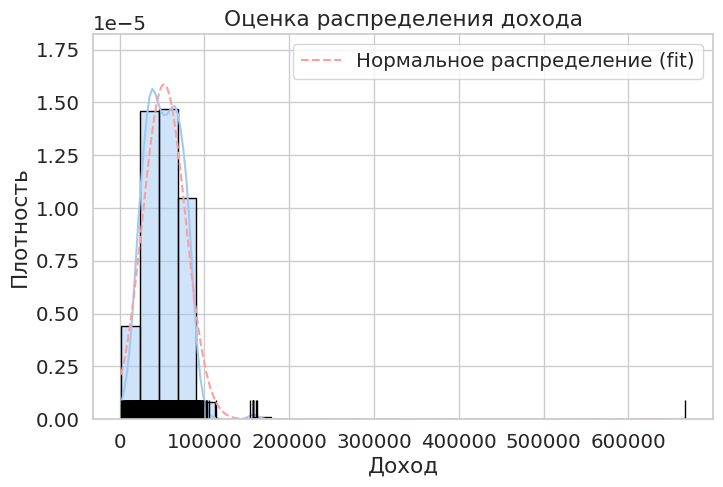

In [ ]:
plt.figure(figsize=(8, 5))

sns.histplot(data['Income'], bins=30, stat='density', kde=True, edgecolor='black')

# Rugplot (штрихи снизу)
sns.rugplot(data['Income'], color='black', height=0.05)

# Теоретическая плотность по нормальному распределению
xmin, xmax = data['Income'].min(), data['Income'].max()
x = np.linspace(xmin, xmax, 500)
params = sps.norm.fit(data['Income'])  # fit вернет (mu, sigma)
pdf_fitted = sps.norm.pdf(x, *params)
plt.plot(x, pdf_fitted, 'r--', label='Нормальное распределение (fit)')

plt.title('Оценка распределения дохода')
plt.xlabel('Доход')
plt.ylabel('Плотность')
plt.legend()
plt.show()

&#x2753; **Вопрос** &#x2753;

> Чем такой подход полезен в аналитике?

<details> <summary> Ответ </summary>

В отличие от гистограмм и боксплотов показывает гладкую кривую плотности, которая поможет увидеть моду(пик) и мультимодальность, асимметрию, хвосты, как похоже на теоретическое распределение.

Помогает увидеть более детальную структуру. Гистограмма грубо режется на бины. + гистограмма показывает только существующие данные, КДЕ их "аппроксимирует" и заполняет пропускими с помощью своих теоретических ядер

Визуально гораздо более приятно накладывать несколько КДЕ кривых, нежели гистограмм.
</details>

Теперь можем посмотреть на все наши признаки:

KeyError: 'Total_Spent'

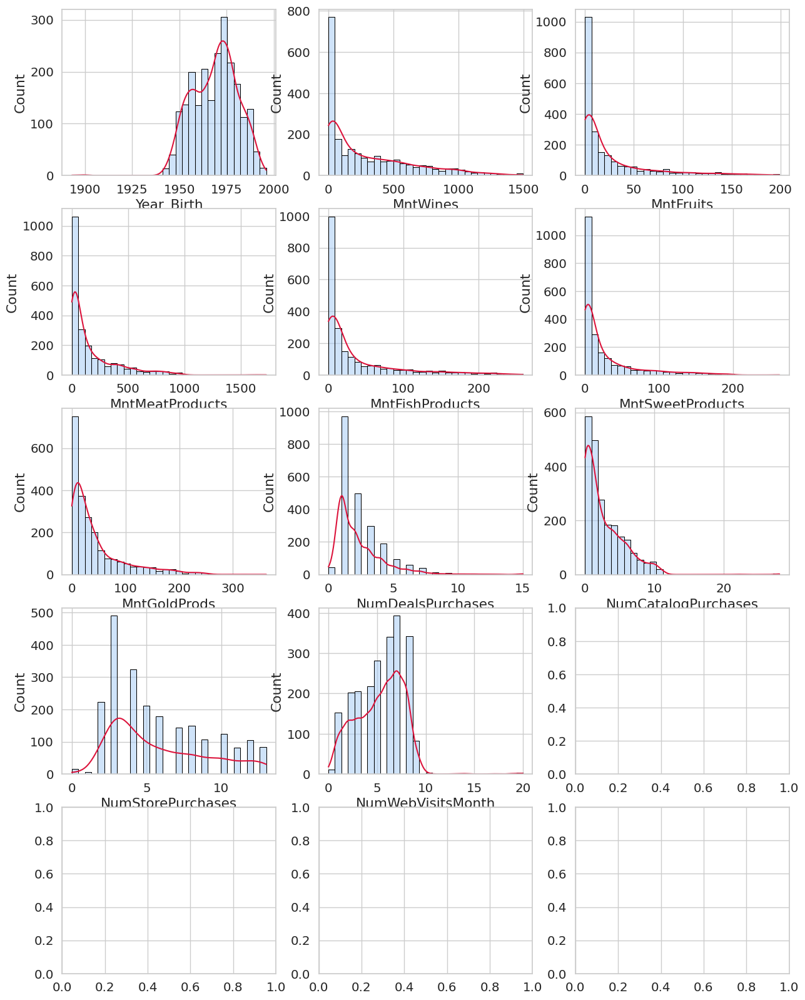

In [15]:
n_num = len(num_columns)
cols = 3
rows = math.ceil(n_num / cols)

fig_hist, axes_hist = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes_hist = axes_hist.flatten()

for i, col in enumerate(num_columns):
    ax = axes_hist[i]
    sns.histplot(data[col], kde=True, ax=ax, edgecolor='black', bins=30)
    kde_line = ax.lines[0]
    kde_line.set_color("crimson")

for j in range(i + 1, len(axes_hist)):
    fig_hist.delaxes(axes_hist[j])

fig_hist.suptitle("Числовые признаки - Гистограммы с KDE", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

Есть признаки в которых мало уникальных значений, будет лучше если мы для них настроим гистограммы.

Можно рисовать барплоты, для примера сделаем гистограммы с KDE, настроив бины так, чтобы они центрировались на целых числах и их было нужное количество.


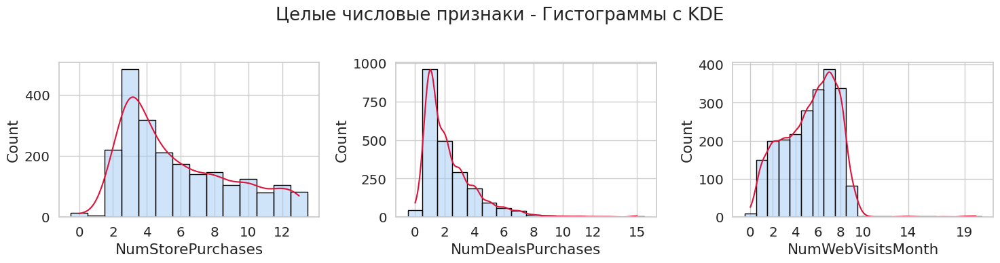

In [ ]:
bar_columns = ['NumStorePurchases', 'NumDealsPurchases', 'NumWebVisitsMonth']

n_num = len(bar_columns)
cols = 3
rows = math.ceil(n_num / cols)

fig_hist, axes_hist = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes_hist = axes_hist.flatten()

for i, col in enumerate(bar_columns):
    ax = axes_hist[i]
    unique_vals = sorted(data[col].dropna().unique())  # получаем уникальные значения
    sns.histplot(
        data[col],
        kde=True,
        bins=[x - 0.5 for x in unique_vals] + [unique_vals[-1] + 0.5],  # бин вокруг каждой целой точки
        ax=ax,
        edgecolor='black'
    )
    if len(unique_vals) > 10: # отображаем только каждый второй тик
        ax.set_xticks(unique_vals[::2])  # чтобы тики совпадали с целыми
    kde_line = ax.lines[0]
    kde_line.set_color("crimson")

for j in range(i + 1, len(axes_hist)):
    fig_hist.delaxes(axes_hist[j])

fig_hist.suptitle("Целые числовые признаки - Гистограммы с KDE")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


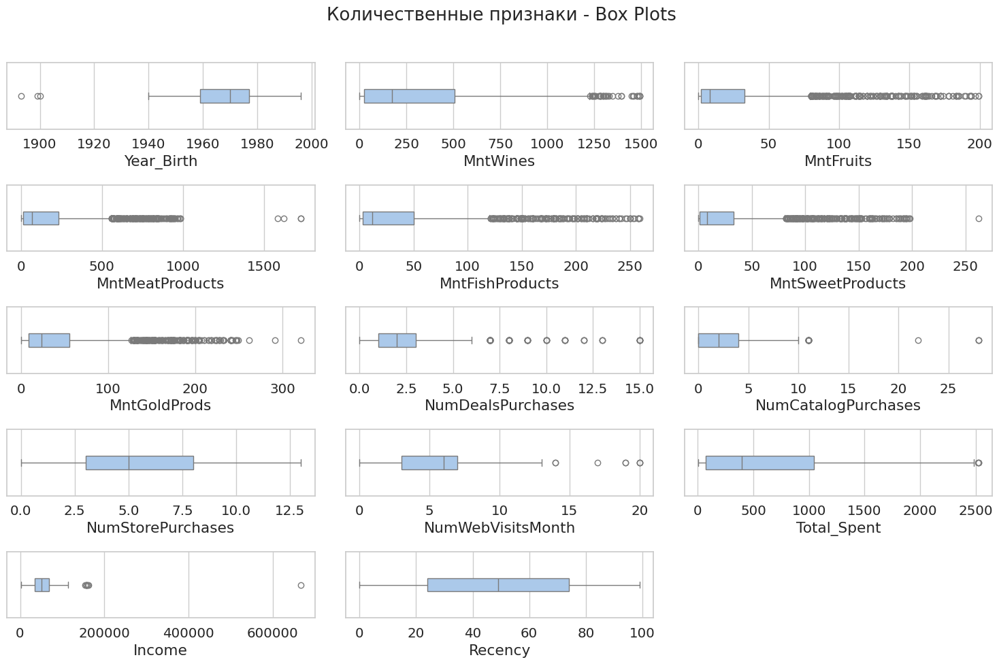

In [ ]:
n_num = len(num_columns)
cols = 3
rows = math.ceil(n_num / cols)

fig_num, axes_num = plt.subplots(rows, cols, figsize=(cols * 5, rows * 2))
axes_num = axes_num.flatten()

for i, col in enumerate(num_columns):
    ax = axes_num[i]
    sns.boxplot(data=data, x=col, ax=ax, width=0.2)

# Удаляем пустые оси
for j in range(i + 1, len(axes_num)):
    fig_num.delaxes(axes_num[j])

fig_num.suptitle("Количественные признаки - Box Plots")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

Нет абсурдных данных (например, с отрицательными тратами), это хорошо (хотя у нас есть люди, которым больше 100 лет и они были в магазине 30 дней назад🫠).

&#x2753; **Вопрос** &#x2753;

> Мы видим, что в данных много выбросов. Надо ли их убирать? В каких признаках?

## Новый раздел
<details>
 <summary> Кликни для показа ответа </summary>

Выбросы — это значения, которые значительно отличаются от основной массы данных. Их видно на боксплотах как точки, лежащие вне "усов".

Много выбросов:
* **Income** — очень сильный выброс (>600,000)
* **Total_Spent** — заметный выброс справа
* **MntWines, MntMeatProducts, MntGoldProds** — длинные хвосты и экстремальные значения

Некоторые выбросы:

* **NumCatalogPurchases, NumDealsPurchases, NumWebVisitsMonth**

*Убирать или не убирать?*

Если есть надежный способ проверить, что эти значения ошибочные — да.

Ответ всегда зависит от задачи. С одной стороны, выбросы могут исказить наши тренды, среднее, медианы, корреляции. С другой — могут быть важными контрибьюторами.

Если мы применяем методы или метрики, чувствительные к таким выбросам, то их надо либо удалить, либо выбрать устойчивые способы анализа.

</details><br/>

In [ ]:
data[data.Year_Birth == min(data['Year_Birth'])]

,Id,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain,Total_Children,Total_Spent
513,11004,1893,2n Cycle,Single,60182.0,0,1,2014-05-17,23,8,...,2,1,1,0,2,4,0,0,1,22


😳😳😳😳

И теперь то же самое посмотрим с помощью violin plot.

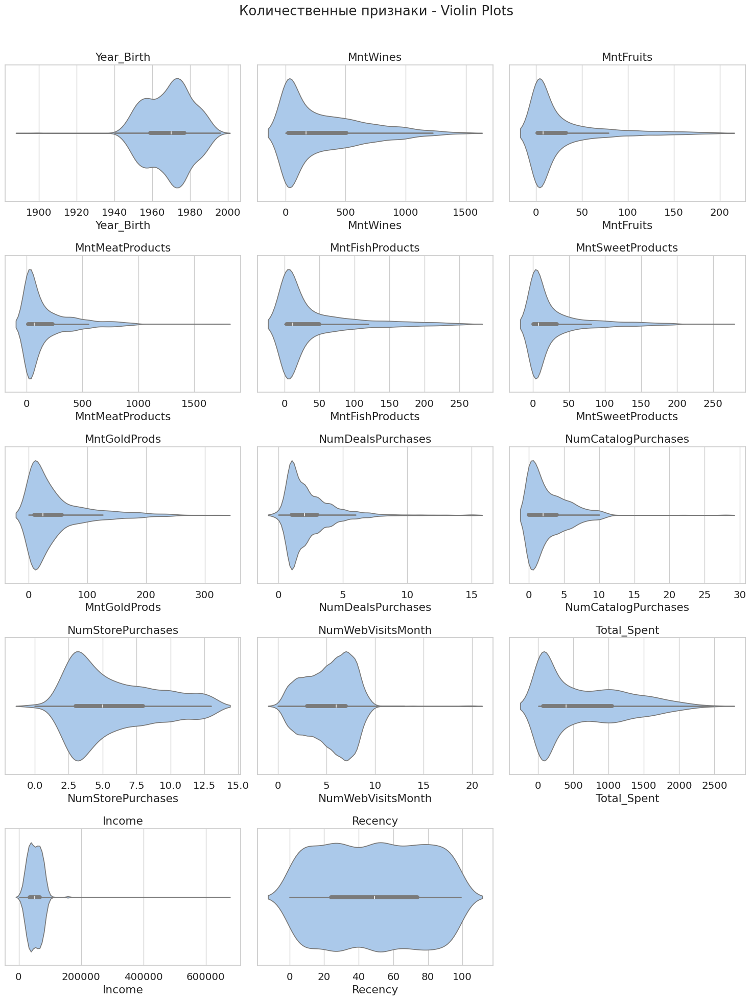

In [ ]:
n_num = len(num_columns)
cols = 3
rows = math.ceil(n_num / cols)

fig_num, axes_num = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes_num = axes_num.flatten()

for i, col in enumerate(num_columns):
    sns.violinplot(data=data, x=col, ax=axes_num[i], inner='box')
    axes_num[i].set_title(col)

for j in range(i + 1, len(axes_num)):
    fig_num.delaxes(axes_num[j])

fig_num.suptitle("Количественные признаки - Violin Plots")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

&#x2753; **Вопрос** &#x2753;

> Какие методы визуализации предпочтительнее в разных ситуациях?

<details>
 <summary> Кликни для показа ответа </summary>

Можно провести следующую аналогию:

- Гистограмма подходит для анализа распределения одного числового признака — она показывает форму распределения, наличие выбросов, симметрию или асимметрию.

- Boxplot (ящик с усами) полезен, когда нужно сравнить распределения числового признака между различными категориями — он наглядно отображает медиану, квартильные границы и выбросы.

- Violin plot объединяет достоинства boxplot и графика плотности — он даёт более полное представление о распределении внутри каждой категории, особенно если форма распределения играет важную роль в анализе.

</details><br/>

### 4. Взаимодействия признаков друг с другом

Так же можно рассмотреть распределения данных по двум осям-признакам с разделением по какому-то классу.

In [ ]:
subset_cols = num_columns + ['Response']
clean_data = data[subset_cols]
clean_data

,Year_Birth,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Total_Spent,Income,Recency,Response
0,1970,189,104,379,111,189,218,1,4,6,1,1190,84835.0,0,1
1,1961,464,5,64,7,0,37,1,3,7,5,577,57091.0,0,1
2,1958,134,11,59,15,2,30,1,2,5,2,251,67267.0,0,0
3,1967,10,0,1,0,0,0,1,0,2,7,11,32474.0,0,0
4,1989,6,16,24,11,0,34,2,1,2,7,91,21474.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1976,372,18,126,47,48,78,2,2,11,4,689,66476.0,99,0
2236,1977,5,10,13,3,8,16,1,0,3,8,55,31056.0,99,0
2237,1976,185,2,88,15,5,14,2,1,5,8,309,46310.0,99,0
2238,1978,267,38,701,149,165,63,1,4,10,3,1383,65819.0,99,0


**PairGrid в Seaborn**

`PairGrid` — это мощный инструмент для визуализации попарных отношений между переменными в наборе данных. Он создаёт сетку графиков, где каждый элемент показывает взаимосвязь между двумя переменными, что особенно полезно на начальных этапах анализа данных.

**Конструктор PairGrid**

```
sns.PairGrid(
    data,
    hue=None,
    hue_order=None,
    palette=None,
    hue_kws=None,
    vars=None,
    x_vars=None,
    y_vars=None,
    diag_sharey=True,
    height=2.5,  # в новых версиях вместо size используется height
    aspect=1,
    despine=True,
    dropna=True
)
```


Основные параметры PairGrid:

| Параметр | Описание |
|----------|----------|
| `data`   | DataFrame с данными |
| `hue`    | Столбец для группировки данных (цветовое кодирование) |
| `vars`   | Список переменных для анализа (по умолчанию все числовые колонки) |
| `height` | Высота каждого графика в дюймах |
| `aspect` | Соотношение ширины и высоты графиков |

Методы PairGrid для построения графиков:

| Метод | Описание | Типичные функции |
|-------|----------|------------------|
| `.map(func)` | Применяет функцию ко всем графикам | `sns.scatterplot`, `plt.plot` |
| `.map_diag(func)` | Только диагональные графики | `sns.histplot`, `sns.kdeplot` |
| `.map_offdiag(func)` | Все графики кроме диагональных | `sns.scatterplot`, `sns.regplot` |
| `.map_lower(func)` | Графики ниже диагонали | `sns.kdeplot`, `hexbin` |
| `.map_upper(func)` | Графики выше диагонали | `sns.heatmap`, `sns.violinplot` |

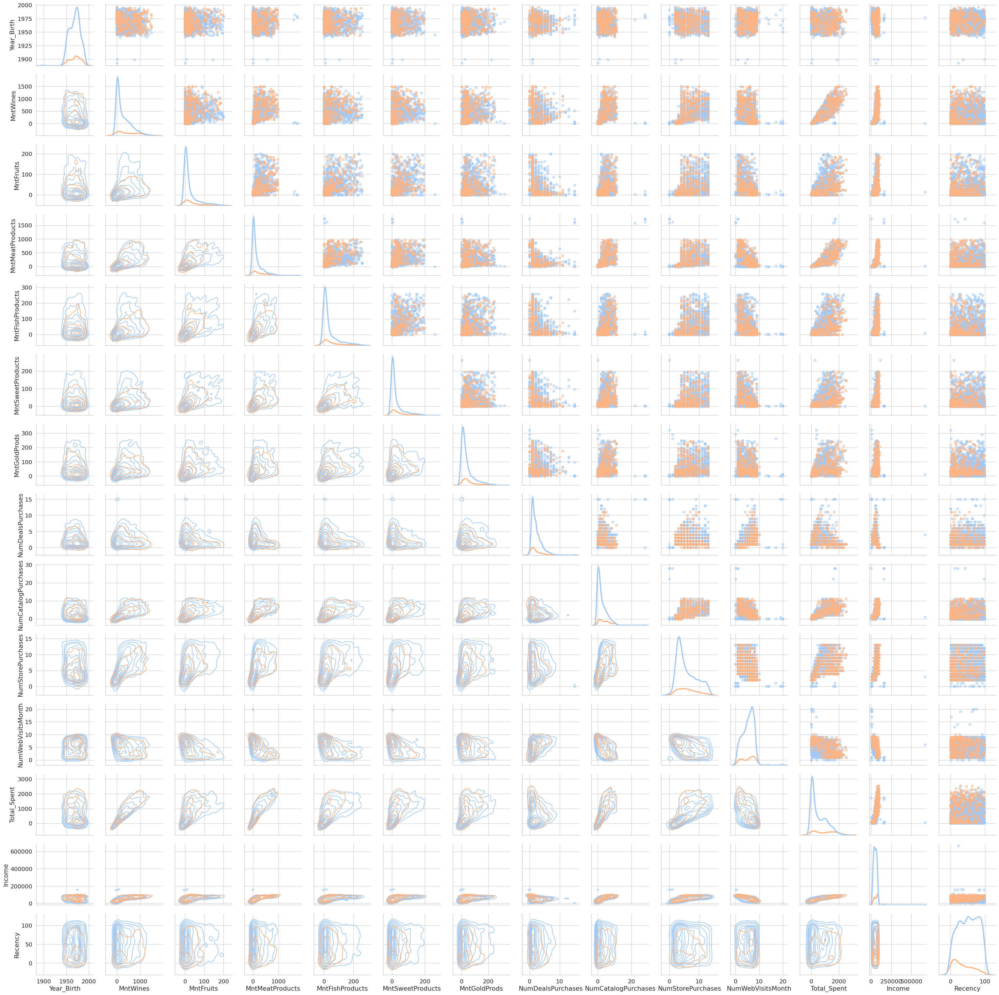

In [ ]:
g = sns.PairGrid(clean_data, diag_sharey=False, hue='Response')
g.map_lower(sns.kdeplot)
g.map_upper(plt.scatter, alpha=0.5)
g.map_diag(sns.kdeplot, lw=3);

Похожая функция

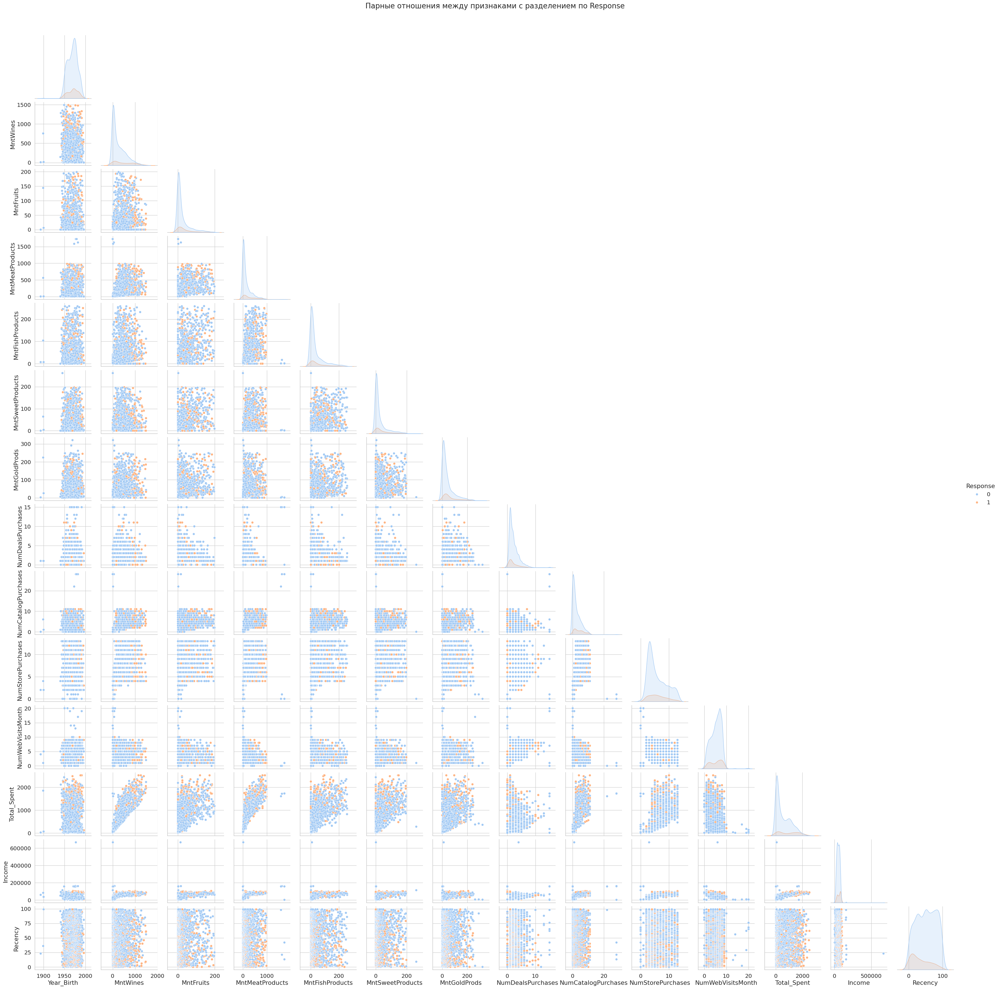

In [ ]:
sns.pairplot(clean_data, hue='Response', vars=num_columns, corner=True)
plt.suptitle('Парные отношения между признаками с разделением по Response', y=1.02)
plt.show()

Разница между PairPlot и PairGrid в том, что первая просто более простая в использовании)

PairGrid очень полезен в исследованиях, посколько помогает быстро найти взаимосвязи между переменными: выявить линейные и нелинейные зависимости, обнаружить кластеры и выбросы, сравнить распределение.

Единственный минус — когда признаков много, не стоит их все класть в PairGrid, потому что можно получить визуальный шум.



Немного про корреляционный анализ

> **Коэффициент корреляции**
>
> Это число от -1 до 1, которое показывает, насколько сильно две переменные зависят друг от друга **линейно**.
>
> * **Близко к 1**: Чем больше одна переменная, тем больше другая (например, рост и вес).
> * **Близко к -1**: Чем больше одна переменная, тем меньше другая (например, скорость и время в пути).
> * **Близко к 0**: Линейной связи нет, переменные не влияют друг на друга напрямую.
>
> Важно: этот коэффициент "видит" только простые линейные зависимости. Сложные связи он может не заметить.

---

**Clustermap и Heatmap**

- `sns.heatmap()` — просто рисует значения корреляции между переменными в виде матрицы
- `sns.clustermap()` — то же самое, но с **иерархической кластеризацией**, группирует признаки с похожими паттернами корреляций



Также можно визуализировать парные корреляции с помощью `heatmap`, создающего двумерную таблицу в виде тепловой карты.

```
sns.heatmap(data,
    vmin=None, vmax=None, cmap=None, center=None, robust=False,
    annot=None, fmt='.2g', annot_kws=None, linewidths=0, linecolor='white',
    cbar=True, cbar_kws=None, cbar_ax=None, square=False,
    xticklabels='auto', yticklabels='auto', mask=None, ax=None, **kwargs)

```

- `data` — 2D-данные;
- `vmin` и `vmax` — минимальное и максимальное значения цветов;
- `cmap` — цветовая схема;
- `robust` — если не указаны vmin и vmax, то не используются выбросы при определении минимума и максимума;
- `annot` — в какие ячейки записывать данные;
- `fmt` — формат записи данных;
- `linewidths` — ширина линий между ячейками;
- `linecolor` — цвет линий между ячейками;
- `cbar` — рисовать ли colorbar.

Типичное применение — визуализация корреляции между признаками.



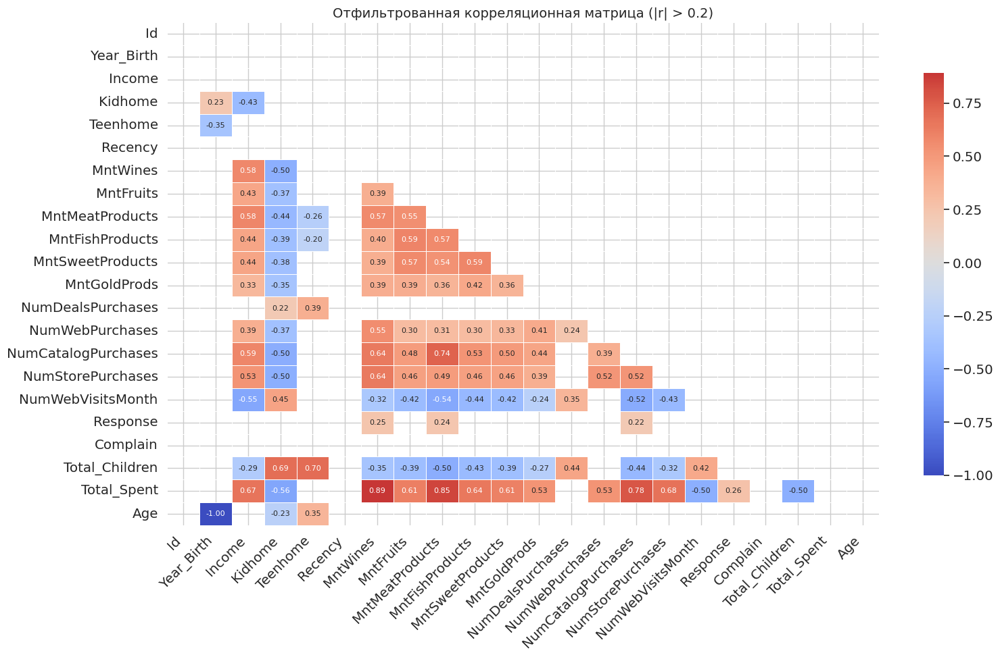

In [ ]:
corr = data.corr(numeric_only=True)

# Убираем корреляции ближе к 0
mask = np.abs(corr) < 0.2
filtered_corr = corr.mask(mask)

plt.figure(figsize=(min(2 + len(filtered_corr.columns), 16), 10))
mask_upper = np.triu(np.ones_like(filtered_corr, dtype=bool))

# всё, что мало коррелирует — прозрачное, + верх треуг
sns.heatmap(filtered_corr, mask=mask_upper, annot=True, fmt=".2f",
            cmap='coolwarm', center=0, linewidths=0.5, cbar_kws={"shrink": 0.8},
            annot_kws={"size": 8})

plt.title('Отфильтрованная корреляционная матрица (|r| > 0.2)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



- Видим, что доход значительно коррелирует с тратами, в том числе по категориям

- Чем больше у людей маленьких детей, тем меньше люди тратят в магазине

- С `Response` коррелируют `MntWines`, `MntMeatProducts`, `NumCatalogPurchases`

- Чем больше доход, тем меньше количество детей 🧐 При этом с возрастом этот признак не коррелирует

- `NumDealsPurchases` — покупки по скидкам — коррелируют только с количеством детей. Видимо семьи с детьми более экономные









`seaborn.clustermap()` - это расширенная версия тепловой карты, которая автоматически группирует похожие строки и/или столбцы, что помогает находить структуру в данных и выделять группы объектов.

Основные параметры (дополняющие стандартные параметры heatmap):

```
seaborn.clustermap(
    data, pivot_kws=None, method='average', metric='euclidean', z_score=None,
    standard_scale=None, figsize=(10, 10), row_cluster=True, col_cluster=True,
    row_colors=None, col_colors=None, mask=None, dendrogram_ratio=0.2, **kwargs
)

```

У функции очень много технических параметров, так что рассмотрим только основные из тех, которых нет среди параметров `heatmap`:

- `data` — 2D-данные;
- `row_cluster`, `col_cluster` — группировать ли строки или столбцы соотв-но;
- `row_colors`, `col_colors` — цветовые метки отдельных строк и столбцов (позволяет следить за их порядком);
- `method` — метод группировки ([см. документацию к иерархической кластеризации](https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html) в scipy);
- `mask` — позволяет указать, какие значения в таблице не показывать (по умолчанию скрываются только пропуски);
- `z_score` — привести ли все строки (если 0) или столбцы (если 1) к одному масштабу `((x - mean(x)) / std(x))`;
- `standard_scale` — перевести ли все строки (если 0) или столбцы (если 1) в диапазон [0, 1] `((x - min(x)) / (max(x) - min(x)))`;


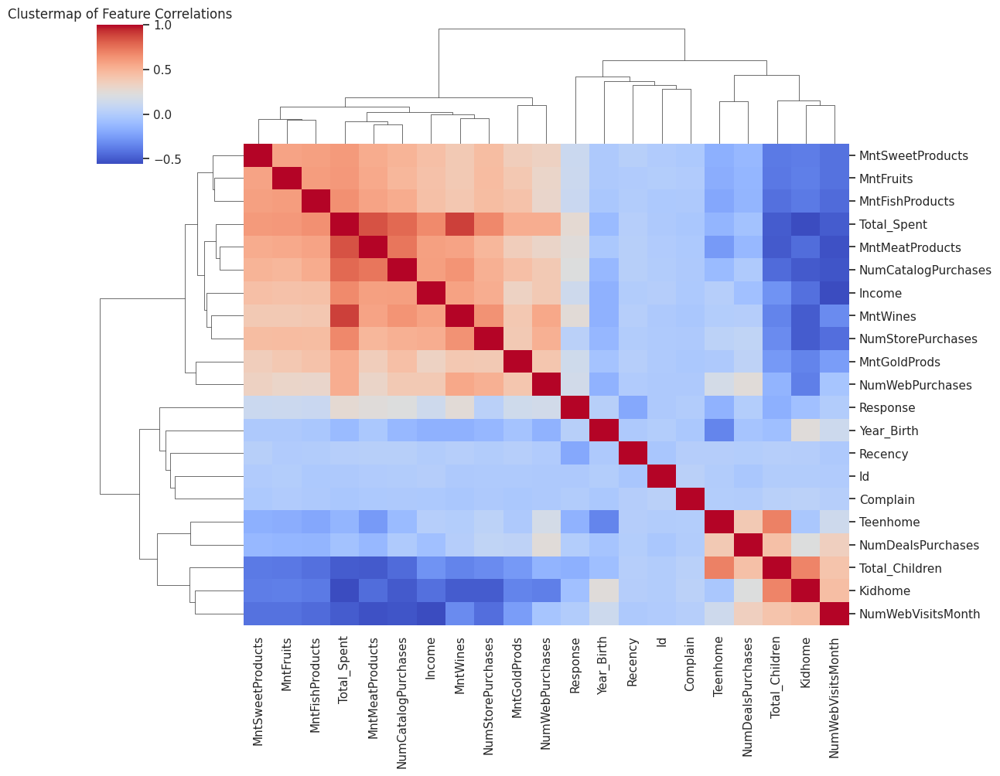

In [ ]:
sns.clustermap(data.corr(numeric_only=True), cmap='coolwarm', annot=False, figsize=(12, 10))
plt.title('Clustermap корреляций признаков')
plt.show()


***Выводы о данных:***

- Видим кластер `Teenhome`, `NumDealsPurchases`, `Total_Children`. Прошлая визуализация нам показала похожие выводы: семьи с детьми чаще покупают товары со скидкой

- Большой кластер `Income`, `Total_Spent` и все `Mnt...` коррелирует — это достаточно логично: человек тратит деньги, только если есть, что потратить

- Дети коррелирует с этим набором с обратной зависимостью

### 5. Таргетное рассмотрение

Можно таргетно рассмотреть зависимости признак-признак. Возьмем `Income` и `MntWines`.

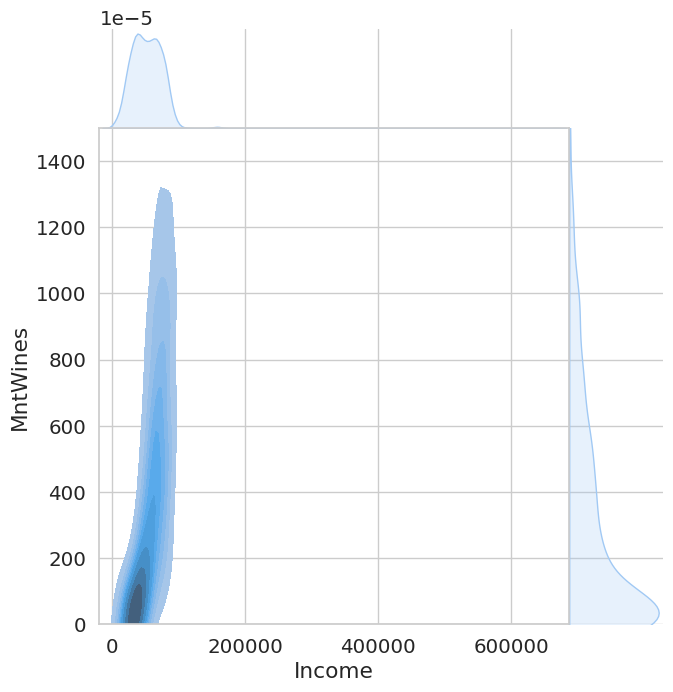

In [ ]:
sns.jointplot(x=data['Income'], y=data['MntWines'], kind='kde', height=7, space=0, fill=True, ylim=(0, 1500))

Также можно визуализировать точками.

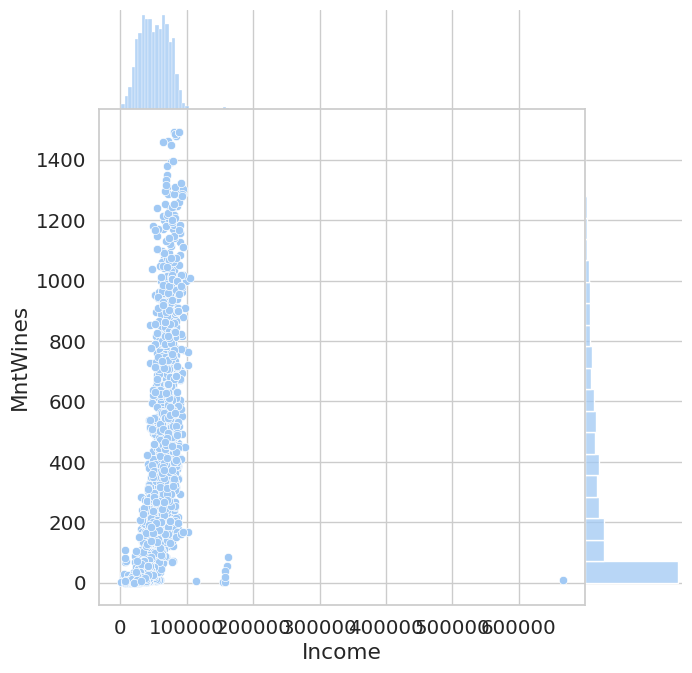

In [ ]:
sns.jointplot(x=data['Income'], y=data['MntWines'], height=7, space=0)

Отметим, что `sns.jointplot` можно конфигурировать вручную! У объекта JointGrid, который эта функция возвращает, можно настраивать все три части графика:

- `ax_marg_x` — верхний график;

- `ax_marg_y` — правый график;

- `ax_joint` — центральный график;

На них можно отрисовать что угодно, в том числе вещи, совершенно не связанные с исходными данными. Но если хочется построить другой график на тех же данных, то на выручку приходят функции plot_joint и plot_marginals

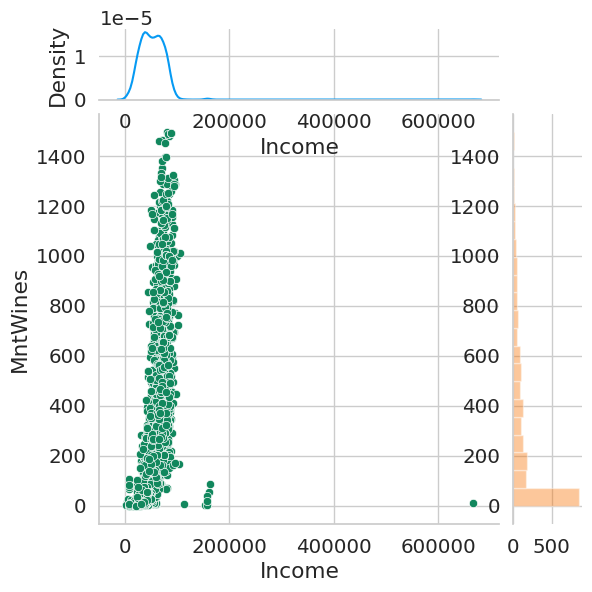

In [ ]:
# центральный график
graph = sns.jointplot(x=data['Income'], y=data['MntWines'], color="xkcd:dark sea green")

# верхний график
graph.ax_marg_x.clear()
sns.kdeplot(data['Income'], color="xkcd:azure", ax=graph.ax_marg_x)

# правый график
graph.ax_marg_y.clear()
sns.distplot(data['MntWines'], vertical=True, kde=False,
              color="xkcd:orange", ax=graph.ax_marg_y);

Еще один способ визуализировать двумерное распределение — через две кде

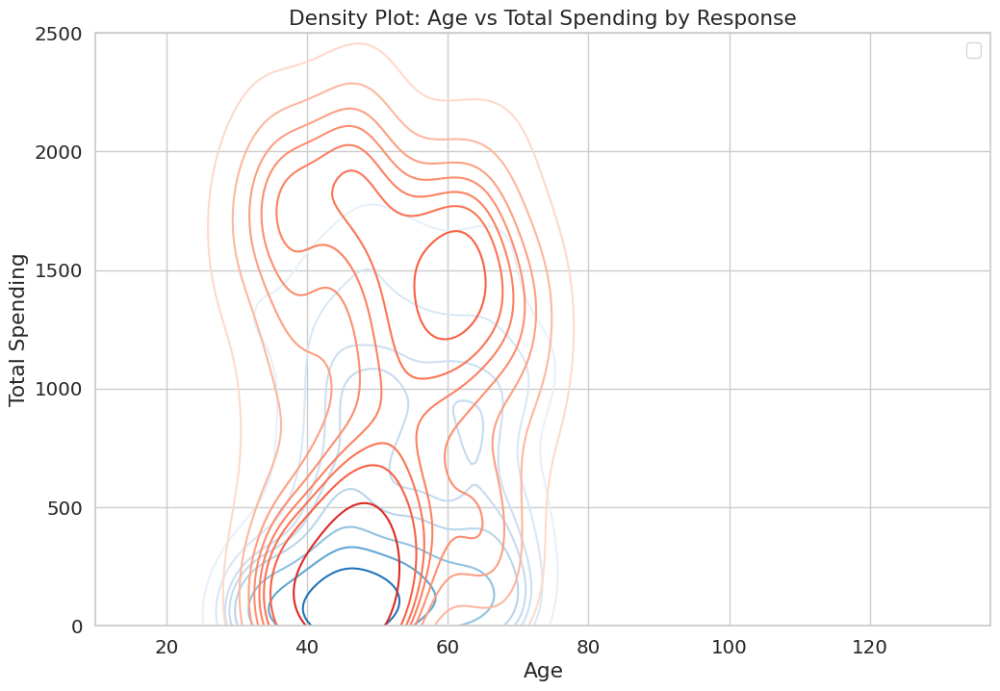

In [ ]:
data['Age'] = 2020 - data['Year_Birth']
plt.figure(figsize=(12, 8))

# Плотность для клиентов, которые не ответили
ax = sns.kdeplot(x=data['Age'][data['Response'] == 0], y=data['Total_Spent'][data['Response'] == 0],
                  label="No Response", cmap='Blues', fill=False, thresh=0.0)

# Плотность для клиентов, которые ответили
ax = sns.kdeplot(x=data['Age'][data['Response'] == 1], y=data['Total_Spent'][data['Response'] == 1],
                  label="Responded", cmap='Reds', fill=False, thresh=0.0)

ax.set_title("Density Plot: Age vs Total Spending by Response")
ax.set_xlabel("Age")
ax.set_ylabel("Total Spending")
ax.set_ylim(0, 2500)

# Легенда
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=labels, title="Marketing Response")

ax.legend().get_frame().set_facecolor("white")

plt.show()


Как уже было сказано — боксплоты полезны, чтобы сравнить признак по категориям.

Несколько таких ящиков можно нарисовать бок о бок, чтобы визуально сравнивать одно распределение с другим; их можно располагать как горизонтально, так и вертикально. Расстояния между различными частями ящика позволяют определить степень разброса (дисперсии) и асимметрии данных и выявить выбросы.



**Параметры `seaborn.boxplot()`**

| Параметр      | Описание |
|---------------|----------|
| `x`, `y`      | Переменные на осях (одномерные данные или имена столбцов из `data`) |
| `hue`         | Группировка по категориям (например, `hue='Gender'`) |
| `data`        | DataFrame, из которого берутся данные |
| `orient`      | `'v'` или `'h'` — ориентация графика |
| `color`       | Цвет графика (один цвет) |
| `palette`     | Цветовая палитра (если `hue` задан) |
| `width`       | Ширина ящиков (по умолчанию `0.8`) |
| `dodge`       | Разносить ли ящики по `hue` (`True/False`) |
| `fliersize`   | Размер точек-выбросов |
| `linewidth`   | Толщина линий |
| `whis`        | Длина "усов" (например, `1.5` означает 1.5×IQR) |
| `notch`       | Показывать ли вырез под медиану (`True/False`) |

---

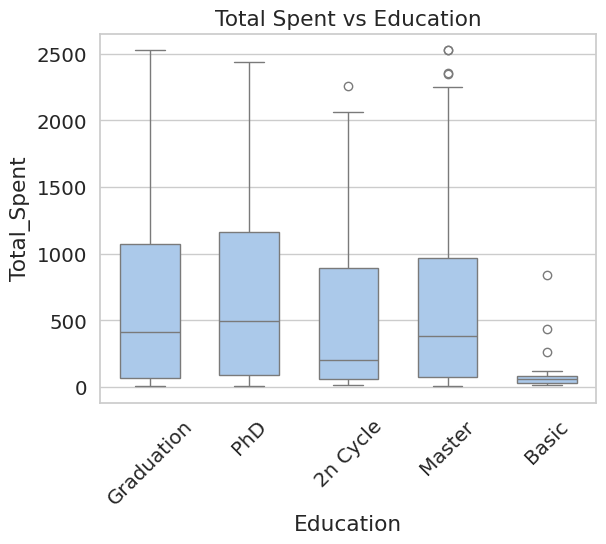

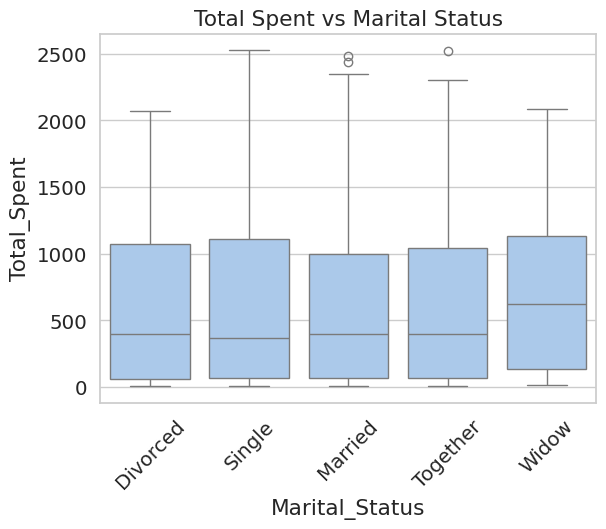

In [ ]:
sns.boxplot(x='Education', y='Total_Spent', data=data, width = 0.6)
plt.title('Total Spent vs Education')
plt.xticks(rotation=45)
plt.show()

sns.boxplot(x='Marital_Status', y='Total_Spent', data=data)
plt.title('Total Spent vs Marital Status')
plt.xticks(rotation=45)
plt.show()


Если вспомнить нашу неуверенность о том, что такое `2h Cycle` — высшее образование или среднее, то видим, что этот признак ведет себя больше как высшее образование.

Еще можно воспользоваться парметром `hue`

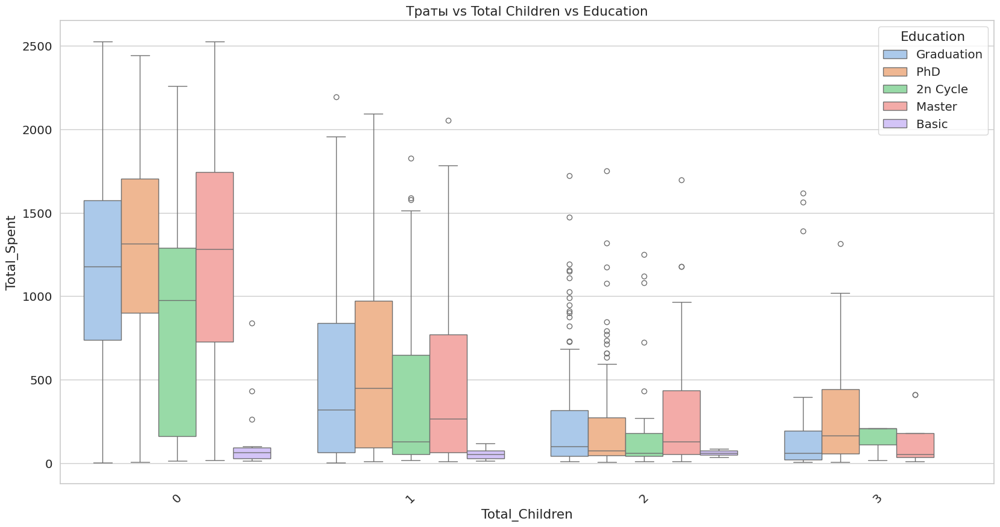

In [ ]:
plt.figure(figsize=(20, 10))
sns.boxplot(x='Total_Children', y='Total_Spent', data=data, hue='Education')
plt.title('Траты vs Total Children vs Education')
plt.xticks(rotation=45)
plt.show()

Видим, что люди, у которых есть дети тратят *значительно* меньше, причем тренд сохраняется с ростом числа детей и общая для всех ступеней образования.

**С чем это может быть связано?**




### 6. Попробуем вспомнить, зачем мы это делаем

Теперь посмотрим на нашу целевую переменную. Вспоминаем, что вообще у магазина была задача оценить, можно ли таргетно запустить рекламную кампанию и понять, от чего зависит, откликнется ли клиент.

Для сравнения, одно и то же визуализируем боксплотом, вайолином и гистограммой.

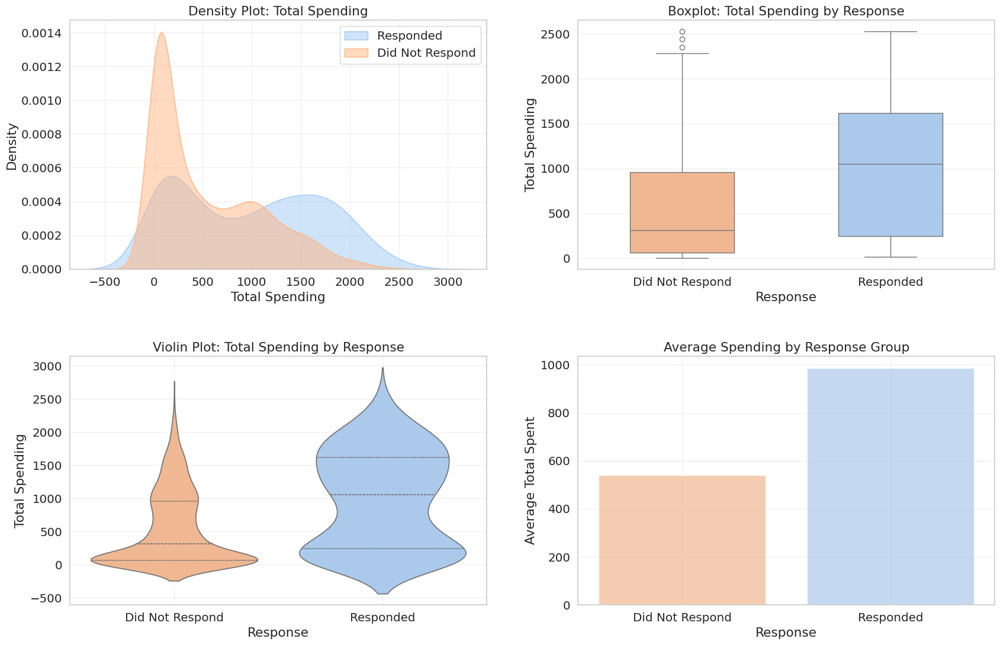

In [ ]:
plt.figure(figsize=(18, 12))
colors = sns.color_palette('pastel')
responded_color = colors[0]
not_responded_color = colors[1]

# KDE Plot
plt.subplot(2, 2, 1)
sns.kdeplot(data=data[data['Response'] == 1]['Total_Spent'],
            label='Responded',
            fill=True,
            color=responded_color,
            alpha=0.5)
sns.kdeplot(data=data[data['Response'] == 0]['Total_Spent'],
            label='Did Not Respond',
            fill=True,
            color=not_responded_color,
            alpha=0.5)
plt.title('Density Plot: Total Spending')
plt.xlabel('Total Spending')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)

# Boxplot
plt.subplot(2, 2, 2)
sns.boxplot(x='Response', y='Total_Spent', data=data,
            width=0.5,
            palette=[not_responded_color, responded_color])
plt.title('Boxplot: Total Spending by Response')
plt.xticks([0, 1], ['Did Not Respond', 'Responded'])
plt.ylabel('Total Spending')
plt.grid(True, alpha=0.3)

# Violin plot
plt.subplot(2, 2, 3)
sns.violinplot(x='Response', y='Total_Spent', data=data,
               inner='quartile',
               palette=[not_responded_color, responded_color])
plt.title('Violin Plot: Total Spending by Response')
plt.xticks([0, 1], ['Did Not Respond', 'Responded'])
plt.ylabel('Total Spending')
plt.grid(True, alpha=0.3)

# Bar Plot
plt.subplot(2, 2, 4)
avg_spent = data.groupby('Response')['Total_Spent'].mean()
sns.barplot(x=avg_spent.index, y=avg_spent.values,
            palette=[not_responded_color, responded_color],
            alpha=0.7)
plt.xticks([0, 1], ['Did Not Respond', 'Responded'])
plt.title('Average Spending by Response Group')
plt.ylabel('Average Total Spent')
plt.grid(True, alpha=0.3)

plt.tight_layout(pad=3.0)
plt.show()

Какие выводы можно сделать?

Напоминание: данные мы получили ***до*** прошлогодней кампании

Посмотрим на категориальные данные с разделением по ответу:

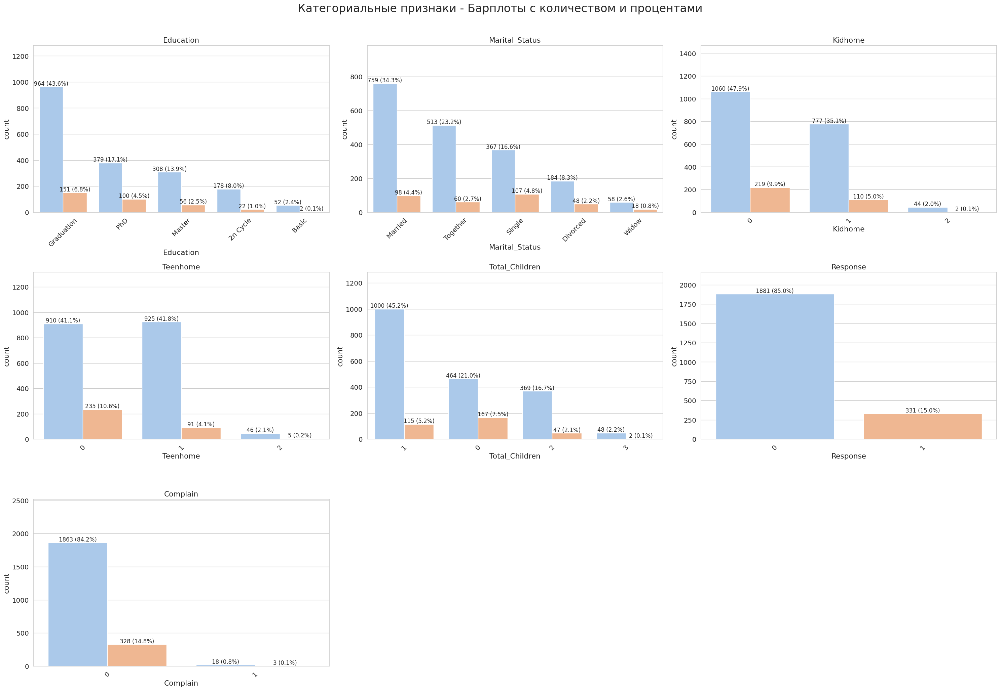

In [ ]:
n_cat = len(cat_columns)
cols = 3
rows = math.ceil(n_cat / cols)

fig_cat, axes_cat = plt.subplots(rows, cols, figsize=(cols * 10, rows * 7))
axes_cat = axes_cat.flatten()

for i, col in enumerate(cat_columns):
    ax = axes_cat[i]
    order = data[col].value_counts().index  # Чтобы порядок был по убыванию
    counts = data[col].value_counts()
    total = len(data)

    sns.countplot(data=data, x=col, ax=ax, order=order, legend=False, hue='Response')
    ax.set_title(col)
    ax.tick_params(axis='x', rotation=45)

    for p in ax.patches:
        count = int(p.get_height())
        percent = 100 * count / total
        ax.annotate(f'{count} ({percent:.1f}%)',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=12)
    ax.set_ylim(0, max(counts.values) * 1.15)

# Удаляем лишние оси
for j in range(i + 1, len(axes_cat)):
    fig_cat.delaxes(axes_cat[j])

fig_cat.suptitle("Категориальные признаки - Барплоты с количеством и процентами", fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

На какие особенности можно обратить внимание, чтобы ответить на поставленный вопрос?

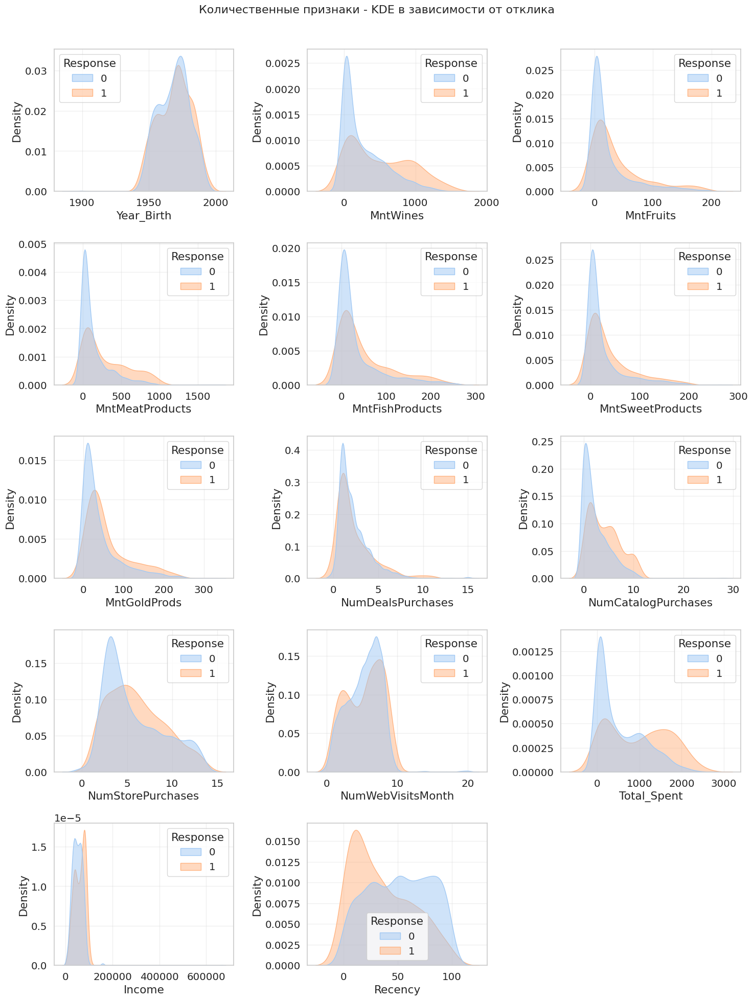

In [ ]:
n_num = len(num_columns)
cols = 3
rows = math.ceil(n_num / cols)

fig_kde, axes_kde = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes_kde = axes_kde.flatten()

for i, col in enumerate(num_columns):
    ax = axes_kde[i]
    sns.kdeplot(data=data, x=col, hue='Response',
                palette={0: colors[0], 1: colors[1]},  # Цвета для классов
                fill=True,                       # Заливка под кривыми
                alpha=0.5,                      # Прозрачность
                ax=ax,
                common_norm=False) # Чтобы нормализация была отдельная для респонса
    ax.set_xlabel(col)
    ax.set_ylabel('Density')
    ax.grid(True, alpha=0.3)

# Удаляем лишние оси
for j in range(i + 1, len(axes_kde)):
    fig_kde.delaxes(axes_kde[j])

fig_kde.suptitle("Количественные признаки - KDE в зависимости от отклика", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

Давайте рядом поставим визуализацию с корреляциями и будем на них смотреть параллельно:

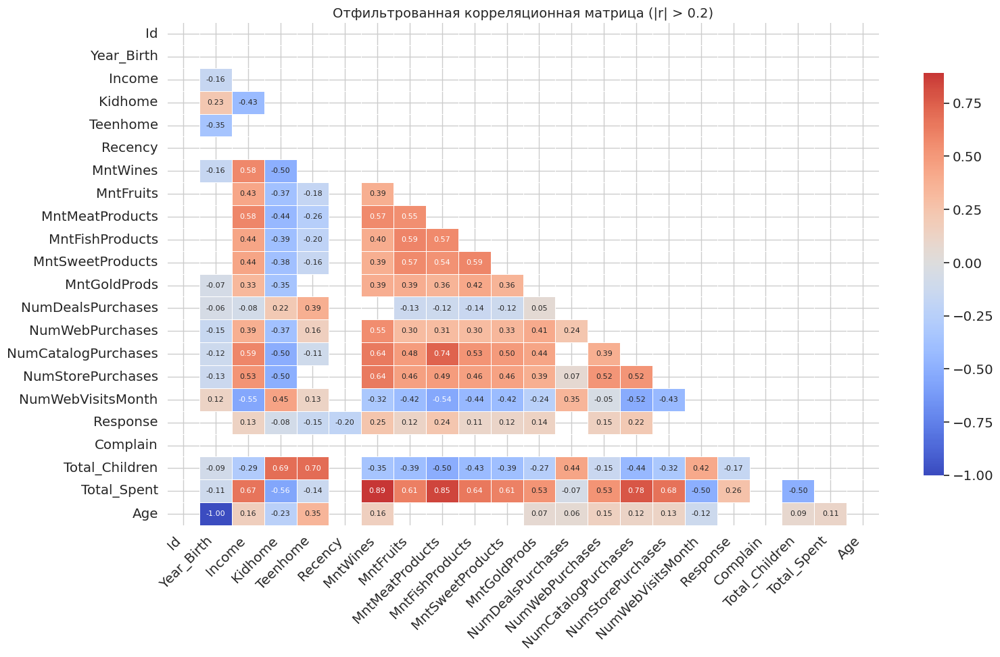

In [ ]:
corr = data.corr(numeric_only=True)

# Убираем корреляции ближе к 0
mask = np.abs(corr) < 0.05
filtered_corr = corr.mask(mask)

plt.figure(figsize=(min(2 + len(filtered_corr.columns), 16), 10))
mask_upper = np.triu(np.ones_like(filtered_corr, dtype=bool))

# всё, что мало коррелирует — прозрачное, + верх треуг
sns.heatmap(filtered_corr, mask=mask_upper, annot=True, fmt=".2f",
            cmap='coolwarm', center=0, linewidths=0.5, cbar_kws={"shrink": 0.8},
            annot_kws={"size": 8})

plt.title('Отфильтрованная корреляционная матрица (|r| > 0.2)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Здесь можно увидеть что формы распределений различются у тех, кто ответил на прошлогоднюю кампанию.

- Те, кто ответил покупают больше вина, мяса, фруктов и тд. Но если мы вспомним матрицу корреляций, то увидим, что эти параметры — корреляты дохода. Поэтому когда этот результат мы будем представлять заказчику, мы не скажем, что "Люди, которые покупают вино лучше отвечают на рекламу", а учтем корреляцию за доходом и сделаем акцент на нем.
То же самое можно сказать про `Total_Spent`

- При этом, видим, что у признака `Recency`очень сильно отличаются формы распределений, хотя он ни с кем не коррелирует сильно. Те, кто "чаще" заходят в магазин будут с большей вероятностью отвечать на рекламу.

***Выводы:***



Мы посмотрели на основные методы визуализации и анализа данных на одном из каггловских датасетов. Очистили и привели данные к удобному нам виду и нарисовали много красивых графиков.

Получили некоторые выводы из наших данных, которые возможно помогут магазину сделать таргетированную рассылку.

- Выявлены ключевые зависимости: дети, доход, частота покупок, выявлены активные и прибыльные сегменты

- Основываясь на наших выводах, можно рекомендовать бизнесу клиентов для таргетированной рассылки: высокодоходные (конечно), частые покупатели, клиенты без детей, любители вина и мяса 😁

- Подгтовили почву для более глубокого анализа и моделирования (EDA это всегда первый шаг для ML)


Теперь вы сможете проводить свои EDA на любых данных (табличных), которые вам приглядятся☺️